# Lab 5.1 Fine-Tuning

In this notebook you will explore fine-tuning a CNN to classify pet breeds.

In [1]:
device = 'cpu'
#device = 'cuda' # set this if using GPU on Colab for example

Here is some code to download a prepared version of the [Oxford-IIIT Pet dataset](https://www.robots.ox.ac.uk/~vgg/data/pets/).

In [2]:
import os
if not os.path.exists('oxford_pets.zip'):
  !wget "https://www.dropbox.com/scl/fi/p49ifha27c2u3uptfj42w/oxford_pets_corrected.zip?rlkey=dwk3dsptzir8v846imsq6bgw3&dl=1" -O oxford_pets.zip
  !unzip -qq oxford_pets.zip

--2025-02-09 19:37:33--  https://www.dropbox.com/scl/fi/p49ifha27c2u3uptfj42w/oxford_pets_corrected.zip?rlkey=dwk3dsptzir8v846imsq6bgw3&dl=1
Resolving www.dropbox.com (www.dropbox.com)... 2620:100:6057:18::a27d:d12, 162.125.2.18
Connecting to www.dropbox.com (www.dropbox.com)|2620:100:6057:18::a27d:d12|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://uc4271ea12b21bc9b2d81b25145c.dl.dropboxusercontent.com/cd/0/inline/Cj3ZPddbBKiq_4QKth3HcWpbeq4JCjQyBTiY8XwgP-IZZBuTI3p4Nf9_aVR3PyRdZJzywO46meVl-2nzqpW29xOo_7oIrGHUXhDQ1ehPRdtiCojizB6qK0GZbLa479c-ZowCPx-d4DNpC-uMYkUD2djC/file?dl=1# [following]
--2025-02-09 19:37:34--  https://uc4271ea12b21bc9b2d81b25145c.dl.dropboxusercontent.com/cd/0/inline/Cj3ZPddbBKiq_4QKth3HcWpbeq4JCjQyBTiY8XwgP-IZZBuTI3p4Nf9_aVR3PyRdZJzywO46meVl-2nzqpW29xOo_7oIrGHUXhDQ1ehPRdtiCojizB6qK0GZbLa479c-ZowCPx-d4DNpC-uMYkUD2djC/file?dl=1
Resolving uc4271ea12b21bc9b2d81b25145c.dl.dropboxusercontent.com (uc4271ea12b21bc9b2d81b25145c.dl.dropb

In [5]:
!pip install torchmetrics
import torch
import torch.nn as nn
import torchvision
import torchmetrics
import numpy as np
from matplotlib import pyplot as plt
from tqdm import tqdm


[notice] A new release of pip is available: 25.0 -> 25.0.1
[notice] To update, run: pip install --upgrade pip


The following code sets up dataset and dataloaders for the data.  It creates two versions: the `no_transform` version does not apply any transformations, and the other one applies the appropriate transformations for the VGG16 model (resize, recropping, centering, and scaling).

In [6]:
transforms = torchvision.models.VGG16_Weights.IMAGENET1K_V1.transforms()

train_ds_no_transform = torchvision.datasets.ImageFolder(
    'oxford_pets/train',
)
train_ds = torchvision.datasets.ImageFolder(
    'oxford_pets/train',
    transform=transforms
)
train_loader = torch.utils.data.DataLoader(train_ds, batch_size=32, shuffle=True)
test_ds_no_transform = torchvision.datasets.ImageFolder(
    'oxford_pets/test',
)
test_ds = torchvision.datasets.ImageFolder(
    'oxford_pets/test',
    transform=transforms
)
test_loader = torch.utils.data.DataLoader(test_ds, batch_size=32, shuffle=False)

In [7]:
train_ds

Dataset ImageFolder
    Number of datapoints: 6639
    Root location: oxford_pets/train
    StandardTransform
Transform: ImageClassification(
               crop_size=[224]
               resize_size=[256]
               mean=[0.485, 0.456, 0.406]
               std=[0.229, 0.224, 0.225]
               interpolation=InterpolationMode.BILINEAR
           )

Text(0.5, 1.0, 'Abyssinian')

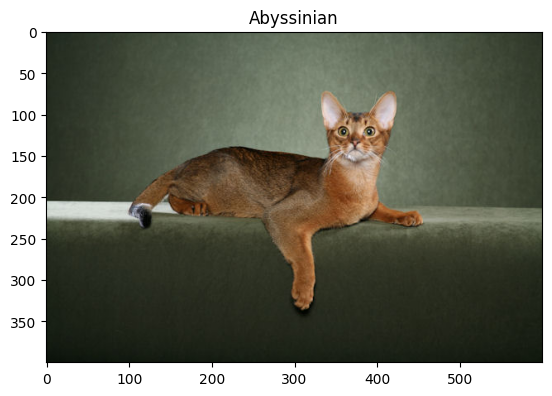

In [8]:
image,label = next(iter(train_ds_no_transform))
plt.imshow(image)
plt.title(train_ds.classes[label])

Now we will grab the VGG16 model with pretrained weights.

In [9]:
vgg16 = torchvision.models.vgg16(weights=torchvision.models.VGG16_Weights.IMAGENET1K_V1).to(device)

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /Users/ishaansathaye/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100.0%


In [10]:
vgg16

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

### Exercises

1. Iterate through the parameters of the `features` part of VGG16 and set `requires_grad=False` on each paramter.

In [12]:
for param in vgg16.features.parameters():
    param.requires_grad = False

2. Replace the `classifier` part of the network with a new `Sequential` model that has 35 outputs for the 35 pet breeds.

*Note:* You can do `vgg16.classifier = nn.Sequential(...).to(device)`.

In [13]:
# Replace the classifier part of the network with a new Sequential model that has 35 outputs for the 35 pet breeds
# Note: You can do vgg16.classifier = nn.Sequential(...).to(device)

vgg16.classifier = nn.Sequential(
    nn.Linear(25088, 4096, bias=True),
    nn.ReLU(inplace=True),
    nn.Dropout(p=0.5, inplace=False),
    nn.Linear(4096, 4096),
    nn.ReLU(inplace=True),
    nn.Dropout(p=0.5, inplace=False),
    nn.Linear(4096, 35, bias=True)
).to(device)

3. Use the following code to check the test set accuracy of the model *before* training it.  Interpret the result.

In [14]:
metric = torchmetrics.Accuracy('multiclass',num_classes=35).to(device)
metric.reset()
for x_batch, y_batch in test_loader:
    y_pred = vgg16(x_batch.to(device))
    metric(y_pred, y_batch.to(device))
metric.compute()

tensor(0.0271)

tensor(0.0271) means that the accuracy of the model is 2.71% before training. A 2.71% accuracy means that the model is not able to predict the correct class of the image and is just randomly guessing.

5. Now train the model on the training set for three epochs.

In [15]:
# Now train the model on the training set for 3 epochs

optimizer = torch.optim.Adam(vgg16.parameters(), lr=0.0001)
loss_fn = nn.CrossEntropyLoss()

for epoch in range(3):
    metric.reset()
    for x_batch, y_batch in tqdm(train_loader):
        optimizer.zero_grad()
        y_pred = vgg16(x_batch.to(device))
        loss = loss_fn(y_pred, y_batch.to(device))
        loss.backward()
        optimizer.step()
        metric(y_pred, y_batch.to(device))
    print(f'Epoch {epoch+1}, accuracy: {metric.compute()}')

100%|██████████| 208/208 [10:37<00:00,  3.06s/it]


Epoch 1, accuracy: 0.6880554556846619


100%|██████████| 208/208 [10:34<00:00,  3.05s/it]


Epoch 2, accuracy: 0.9173068404197693


100%|██████████| 208/208 [10:13<00:00,  2.95s/it]

Epoch 3, accuracy: 0.9623437523841858


6. Evaluate the accuracy of the fine-tuned model on the test set.

In [16]:
# Evaluate the accuracy of the fine-tuned model on the test set

metric.reset()
for x_batch, y_batch in test_loader:
    y_pred = vgg16(x_batch.to(device))
    metric(y_pred, y_batch.to(device))
metric.compute()

tensor(0.8606)

7. The following code will show some test images with the correct and predicted labels.

In [17]:
vgg16.eval()
preds = []
for x_batch, y_batch in test_loader:
    y_pred = vgg16(x_batch.to(device))
    y_pred = torch.argmax(y_pred,dim=-1)
    preds.append(y_pred.detach().cpu().numpy())
preds = np.concatenate(preds,axis=0)

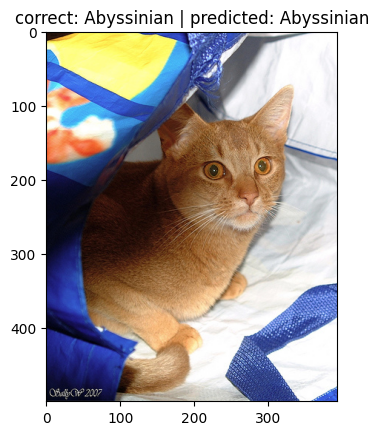

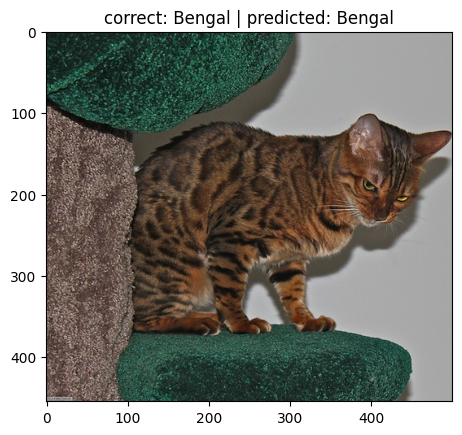

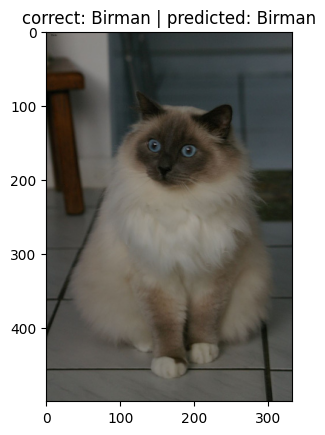

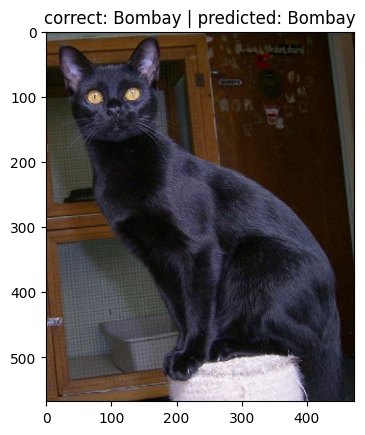

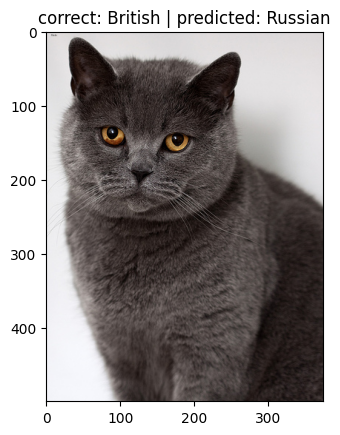

...

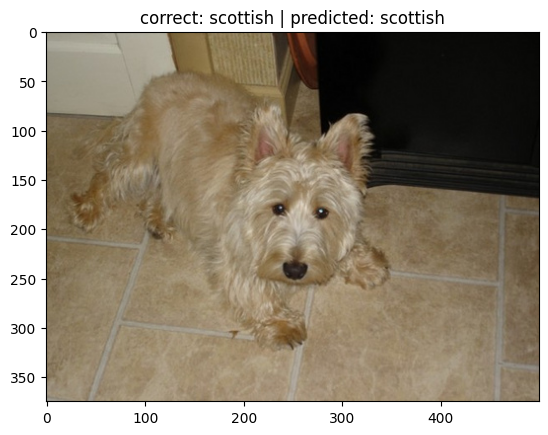

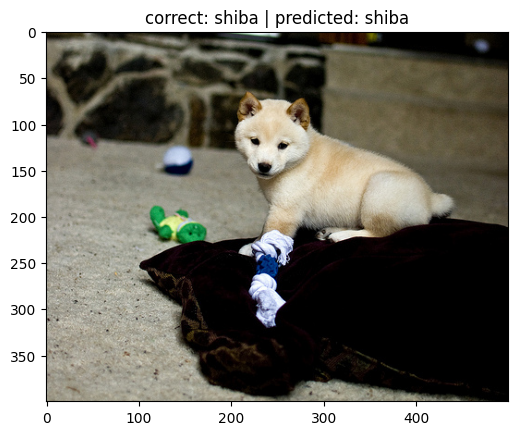

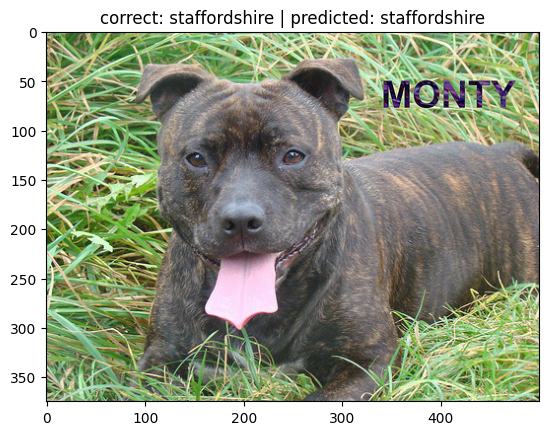

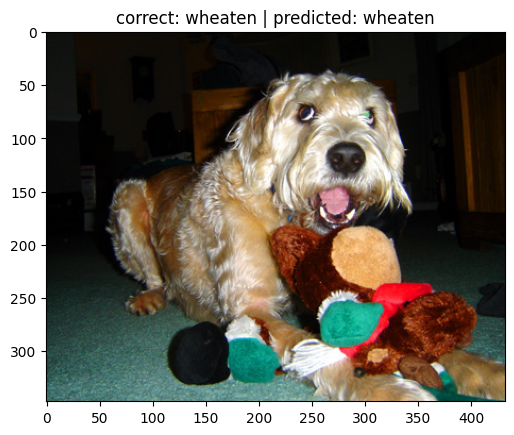

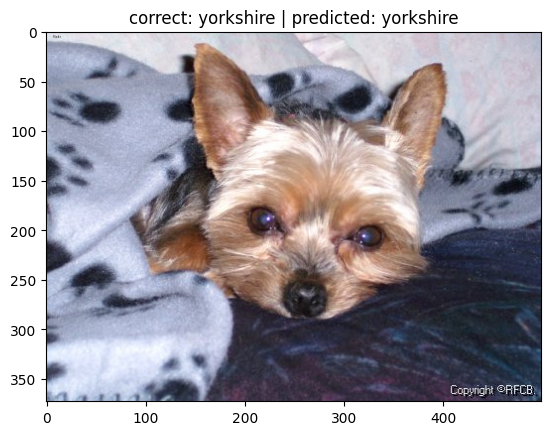

In [18]:
i = 0
for (im,label),pred in zip(test_ds_no_transform,preds):
  if i%20 == 0:
    plt.imshow(im)
    plt.title(f'correct: {test_ds.classes[label]} | predicted: {test_ds.classes[pred]}')
    plt.show()
  i += 1